# Fashion category prediction

This notebook predicts fashion categories based on bounding box coordinates using machine learning models with hyperparameter tuning and cross-validation.

In [3]:
pip install lightgbm

Note: you may need to restart the kernel to use updated packages.


In [4]:
import json
import numpy as np
import pandas as pd
import lightgbm as lgb
import time
from sklearn import svm
from datetime import datetime
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, mean_squared_error
from sklearn.neural_network import MLPClassifier
import plotly.io as pio
pio.renderers.default = 'notebook'

import warnings
warnings.filterwarnings('ignore')

## Data collection and exploratory analysis

In [5]:
# Load fashion data
with open('fashion.json', 'r') as f:
    fashion_data = [json.loads(line) for line in f]

with open('fashion-cat.json', 'r') as f:
    fashion_cat = json.load(f)

In [6]:
print(f"Total products: {len(fashion_data)}")
print(f"Total unique categories: {len(fashion_cat)}")

df = pd.DataFrame(fashion_data)

# Add category information
df['category'] = df['product'].map(fashion_cat)

df.head()

Total products: 72198
Total unique categories: 38111


,product,scene,bbox,category
0,0027e30879ce3d87f82f699f148bff7e,cdab9160072dd1800038227960ff6467,"[0.434097, 0.859363, 0.560254, 1.0]",Apparel & Accessories|Shoes
1,0027e30879ce3d87f82f699f148bff7e,14f59334af4539132981b1324a731067,"[0.175269, 0.527773, 0.621485, 0.924899]",Apparel & Accessories|Shoes
2,0027e30879ce3d87f82f699f148bff7e,e7d32df9f45b691afc580808750f73ca,"[0.588666, 0.638503, 0.750647, 0.761368]",Apparel & Accessories|Shoes
3,0027e30879ce3d87f82f699f148bff7e,c0be585ed21b1a6c6dc9559ebe007ede,"[0.276699, 0.757741, 0.400485, 0.876138]",Apparel & Accessories|Shoes
4,002a6586b8381b5efd39410657630b44,67ed2a06be8a26dc63d7a04d4e1a135f,"[0.154545, 0.144809, 0.809091, 0.784153]","Apparel & Accessories|Handbags, Wallets & Cases"


In [7]:
print("Missing values in dataframe:")
print(df.isnull().sum())
print(f"\nTotal missing values: {df.isnull().sum().sum()}")
print(f"Percentage of missing values: {(df.isnull().sum().sum() / len(df) * 100):.2f}%")

if 'category' in df.columns:
    missing_categories = df['category'].isnull().sum()
    print(f"\nMissing categories: {missing_categories} ({missing_categories/len(df)*100:.2f}%)")

if 'bbox' in df.columns:
    missing_bbox = df['bbox'].isnull().sum()
    print(f"Missing bbox: {missing_bbox} ({missing_bbox/len(df)*100:.2f}%)")

Missing values in dataframe:
product     0
scene       0
bbox        0
category    0
dtype: int64

Total missing values: 0
Percentage of missing values: 0.00%

Missing categories: 0 (0.00%)
Missing bbox: 0 (0.00%)


In [8]:
category_counts = df['category'].value_counts()
print(f"Number of unique categories: {len(category_counts)}")
print(f"\nTop 5 categories:")
print(category_counts.head(5))

fig = px.bar(
    x=category_counts.head(5).index,
    y=category_counts.head(5).values,
    labels={'x': 'category', 'y': 'count'},
    title='Top 5 categories by frequency'
)
fig.update_xaxes(tickangle=20)
fig.show()

Number of unique categories: 10

Top 5 categories:
category
Apparel & Accessories|Shoes                                 22706
Apparel & Accessories|Clothing|Pants                        14289
Apparel & Accessories|Clothing|Shirts & Tops                11957
Apparel & Accessories|Handbags, Wallets & Cases              6322
Apparel & Accessories|Clothing|Outerwear|Coats & Jackets     4788
Name: count, dtype: int64


## Feature engineering


In [9]:
def extract_features(bbox):
    x1, y1, x2, y2 = bbox
    
    features = {
        'x1': x1,
        'y1': y1,
        'x2': x2,
        'y2': y2,
    }
    
    width = x2 - x1
    height = y2 - y1
    area = width * height
    center_x = (x1 + x2) / 2
    center_y = (y1 + y2) / 2
    aspect_ratio = width / height
    
    features.update({
        'width': width,
        'height': height,
        'area': area,
        'center_x': center_x,
        'center_y': center_y,
        'aspect_ratio': aspect_ratio,
        'diagonal': np.sqrt(width**2 + height**2),
        'perimeter': 2 * (width + height)
    })
    
    return features

bbox_features = df['bbox'].apply(extract_features)
feature_df = pd.DataFrame(list(bbox_features))

df_features = pd.concat([df[['product', 'category']], feature_df], axis=1)

print(f"Feature columns: {list(feature_df.columns)}")
df_features.head()


Feature columns: ['x1', 'y1', 'x2', 'y2', 'width', 'height', 'area', 'center_x', 'center_y', 'aspect_ratio', 'diagonal', 'perimeter']


,product,category,x1,y1,x2,y2,width,height,area,center_x,center_y,aspect_ratio,diagonal,perimeter
0,0027e30879ce3d87f82f699f148bff7e,Apparel & Accessories|Shoes,0.434097,0.859363,0.560254,1.000000,0.126157,0.140637,0.017742,0.497175,0.929682,0.897040,0.188929,0.533588
1,0027e30879ce3d87f82f699f148bff7e,Apparel & Accessories|Shoes,0.175269,0.527773,0.621485,0.924899,0.446216,0.397126,0.177204,0.398377,0.726336,1.123613,0.597342,1.686684
2,0027e30879ce3d87f82f699f148bff7e,Apparel & Accessories|Shoes,0.588666,0.638503,0.750647,0.761368,0.161981,0.122865,0.019902,0.669656,0.699936,1.318366,0.203307,0.569692
3,0027e30879ce3d87f82f699f148bff7e,Apparel & Accessories|Shoes,0.276699,0.757741,0.400485,0.876138,0.123786,0.118397,0.014656,0.338592,0.816939,1.045516,0.171292,0.484366
4,002a6586b8381b5efd39410657630b44,"Apparel & Accessories|Handbags, Wallets & Cases",0.154545,0.144809,0.809091,0.784153,0.654546,0.639344,0.418480,0.481818,0.464481,1.023777,0.914982,2.587780


In [10]:
fig = make_subplots(
    rows=3, cols=3,
    subplot_titles=('width', 'height', 'area', 'center X', 'center Y', 'aspect ratio', 
                    'diagonal', 'perimeter', 'x1'),
    specs=[[{"secondary_y": False} for _ in range(3)] for _ in range(3)]
)

features_to_plot = ['width', 'height', 'area', 'center_x', 'center_y', 
                    'aspect_ratio', 'diagonal', 'perimeter', 'x1']

for idx, feature in enumerate(features_to_plot):
    row = idx // 3 + 1
    col = idx % 3 + 1
    fig.add_trace(
        go.Histogram(x=feature_df[feature], nbinsx=50, name=feature, showlegend=False),
        row=row, col=col
    )

fig.update_layout(height=900, title_text="feature distributions")
fig.show()


## Random Uniform Classifier

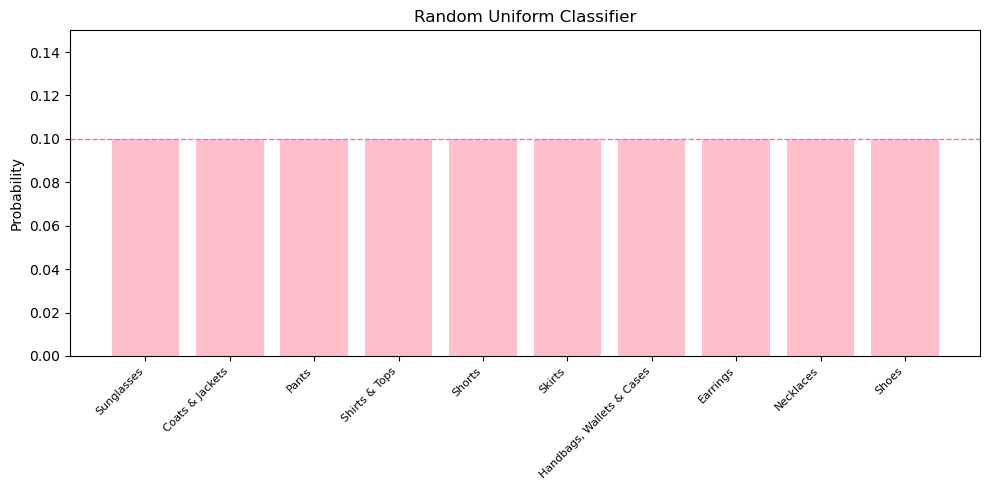

In [11]:
class_labels = [
    'Sunglasses',
    'Coats & Jackets',
    'Pants',
    'Shirts & Tops',
    'Shorts',
    'Skirts',
    'Handbags, Wallets & Cases',
    'Earrings',
    'Necklaces',
    'Shoes'
]

# Equal probability for 10 classes
probabilities = [1/10] * 10  # 0.10 each

plt.figure(figsize=(10, 5))

# Pink color palette (light → medium → dark)
dark_pink = "#FF69B4"  # you can change to "#FFC0CB" or "#C71585" if you prefer

plt.bar(class_labels, probabilities, color='pink')

# Formatting
plt.ylabel("Probability")
plt.title("Random Uniform Classifier")
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.ylim(0, 0.15)

# Horizontal line at 0.1 for emphasis
plt.axhline(0.1, color=dark_pink, linestyle="--", linewidth=1)

plt.tight_layout()
plt.show()


## Pre-processing


In [12]:
feature_columns = ['x1', 'y1', 'x2', 'y2', 'width', 'height', 'area', 
                   'center_x', 'center_y', 'aspect_ratio', 'diagonal', 'perimeter']

X = df_features[feature_columns].values
y = df_features['category'].values

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

print(f"Number of features: {X.shape[1]}")
print(f"Number of samples: {X.shape[0]}")
print(f"Number of classes: {len(label_encoder.classes_)}")
print(f"\nClass distribution:")
unique, counts = np.unique(y_encoded, return_counts=True)
for cls, count in zip(unique[:10], counts[:10]):
    print(f"Class {cls} ({label_encoder.inverse_transform([cls])[0]}): {count} samples")


Number of features: 12
Number of samples: 72198
Number of classes: 10

Class distribution:
Class 0 (Apparel & Accessories|Clothing Accessories|Sunglasses): 4577 samples
Class 1 (Apparel & Accessories|Clothing|Outerwear|Coats & Jackets): 4788 samples
Class 2 (Apparel & Accessories|Clothing|Pants): 14289 samples
Class 3 (Apparel & Accessories|Clothing|Shirts & Tops): 11957 samples
Class 4 (Apparel & Accessories|Clothing|Shorts): 2752 samples
Class 5 (Apparel & Accessories|Clothing|Skirts): 1872 samples
Class 6 (Apparel & Accessories|Handbags, Wallets & Cases): 6322 samples
Class 7 (Apparel & Accessories|Jewelry|Earrings): 1507 samples
Class 8 (Apparel & Accessories|Jewelry|Necklaces): 1428 samples
Class 9 (Apparel & Accessories|Shoes): 22706 samples


In [13]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_encoded, test_size=0.2, stratify=y_encoded
)

print(f"Training set size: {X_train.shape[0]}")
print(f"Test set size: {X_test.shape[0]}")
print(f"Feature dimensions: {X_train.shape[1]}")


Training set size: 57758
Test set size: 14440
Feature dimensions: 12


## Hyperparameter tuning and modeling

In [14]:
models = {
    'random forest': {
        'model': RandomForestClassifier(n_jobs=-1),
        'params': {
            'n_estimators': [50, 100], 
            'max_depth': [10, 20],  
            'min_samples_split': [2, 5]  
        }
    },
    'logistic regression': {
        'model': LogisticRegression(max_iter=1000, n_jobs=-1),
        'params': {
            'C': [0.1, 1],  
            'solver': ['lbfgs', 'liblinear'] 
        }
    },
    'Neural Network': {
        'model': MLPClassifier(random_state=42, max_iter=500),
        'params': {
            'hidden_layer_sizes': [(50,), (100,)],  # Reduced from [(50,), (100,), (50, 50)]
            'alpha': [0.0001, 0.001],  # Reduced from [0.0001, 0.001, 0.01]
            'learning_rate': ['constant']  # Reduced from ['constant', 'adaptive']
        }
    },
    'SVM': {
        'model': svm.SVC(random_state=42),
        'params': {
            'C': [1],  # Reduced from [0.1, 1, 10]
            'kernel': ['rbf']  # Reduced from ['linear', 'rbf', 'poly', 'sigmoid']
        }
    },
}

In [15]:
best_models = {}
cv_results_all = {}

kfold = KFold(n_splits=3, shuffle=True)

print(f"Starting hyperparameter tuning with {kfold.n_splits}-fold CV")
print(f"Total models to train: {len(models)}\n")

for idx, (name, model_config) in enumerate(models.items(), 1):
    start_time = time.time()
    print(f"[{idx}/{len(models)}] Training {name}")
    print(f"Start time: {datetime.now().strftime('%H:%M:%S')}")
    
    param_grid = model_config['params']
    n_combinations = 1
    for param_values in param_grid.values():
        n_combinations *= len(param_values)
    total_fits = n_combinations * kfold.n_splits
    print(f"Parameter combinations: {n_combinations}")
    print(f"Total fits (combinations × CV folds): {total_fits}")
    print(f"Testing parameters: {param_grid}")
    
    grid_search = GridSearchCV(
        model_config['model'],
        model_config['params'],
        cv=kfold,
        scoring='accuracy', 
        n_jobs=-1,
        verbose=1  
    )
    
    grid_search.fit(X_train, y_train)
    
    elapsed_time = time.time() - start_time
    best_models[name] = grid_search.best_estimator_
    cv_results_all[name] = {
        'best_params': grid_search.best_params_,
        'best_score': grid_search.best_score_,
        'cv_results': grid_search.cv_results_
    }
    
    print(f"\n{name} completed in {elapsed_time:.1f} seconds ({elapsed_time/60:.1f} minutes)")
    print(f"Best parameters: {grid_search.best_params_}")
    print(f"Best CV score (accuracy): {grid_search.best_score_:.4f}")
    print(f"End time: {datetime.now().strftime('%H:%M:%S')}")

Starting hyperparameter tuning with 3-fold CV
Total models to train: 4

[1/4] Training random forest
Start time: 19:13:31
Parameter combinations: 8
Total fits (combinations × CV folds): 24
Testing parameters: {'n_estimators': [50, 100], 'max_depth': [10, 20], 'min_samples_split': [2, 5]}
Fitting 3 folds for each of 8 candidates, totalling 24 fits

random forest completed in 28.0 seconds (0.5 minutes)
Best parameters: {'max_depth': 20, 'min_samples_split': 5, 'n_estimators': 100}
Best CV score (accuracy): 0.6391
End time: 19:13:59
[2/4] Training logistic regression
Start time: 19:13:59
Parameter combinations: 4
Total fits (combinations × CV folds): 12
Testing parameters: {'C': [0.1, 1], 'solver': ['lbfgs', 'liblinear']}
Fitting 3 folds for each of 4 candidates, totalling 12 fits


/Users/snigdhapodugu/miniforge3/envs/dsc80/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 11.
  warnings.warn(
/Users/snigdhapodugu/miniforge3/envs/dsc80/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 11.
  warnings.warn(
/Users/snigdhapodugu/miniforge3/envs/dsc80/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 11.
  warnings.warn(
/Users/snigdhapodugu/miniforge3/envs/dsc80/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 11.
  warnings.warn(
/Users/snigdhapodugu/miniforge3/envs/dsc80/lib/python3.1


logistic regression completed in 5.4 seconds (0.1 minutes)
Best parameters: {'C': 1, 'solver': 'lbfgs'}
Best CV score (accuracy): 0.4963
End time: 19:14:04
[3/4] Training Neural Network
Start time: 19:14:04
Parameter combinations: 4
Total fits (combinations × CV folds): 12
Testing parameters: {'hidden_layer_sizes': [(50,), (100,)], 'alpha': [0.0001, 0.001], 'learning_rate': ['constant']}
Fitting 3 folds for each of 4 candidates, totalling 12 fits

Neural Network completed in 57.4 seconds (1.0 minutes)
Best parameters: {'alpha': 0.001, 'hidden_layer_sizes': (100,), 'learning_rate': 'constant'}
Best CV score (accuracy): 0.5503
End time: 19:15:02
[4/4] Training SVM
Start time: 19:15:02
Parameter combinations: 1
Total fits (combinations × CV folds): 3
Testing parameters: {'C': [1], 'kernel': ['rbf']}
Fitting 3 folds for each of 1 candidates, totalling 3 fits

SVM completed in 165.0 seconds (2.7 minutes)
Best parameters: {'C': 1, 'kernel': 'rbf'}
Best CV score (accuracy): 0.5400
End time: 

## Cross-validation results

In [16]:
cv_scores_data = []

for name, results in cv_results_all.items():
    cv_results = results['cv_results']
    mean_scores = cv_results['mean_test_score'] 
    std_scores = cv_results['std_test_score']
    
    param_names = list(cv_results['params'][0].keys())
    
    for i, params in enumerate(cv_results['params']):
        param_str = ', '.join([f"{k}={v}" for k, v in params.items()])
        cv_scores_data.append({
            'Model': name,
            'Parameters': param_str[:50] + '...' if len(param_str) > 50 else param_str,
            'Accuracy': mean_scores[i],
            'Std': std_scores[i]
        })

cv_df = pd.DataFrame(cv_scores_data)

fig = go.Figure()

for model_name in cv_df['Model'].unique():
    model_data = cv_df[cv_df['Model'] == model_name].sort_values('Accuracy', ascending=False)
    fig.add_trace(go.Scatter(
        x=model_data['Parameters'],
        y=model_data['Accuracy'],
        error_y=dict(type='data', array=model_data['Std']),
        mode='markers+lines',
        name=model_name,
        text=model_data['Parameters'],
        hovertemplate='<b>%{text}</b><br>Accuracy: %{y:.4f}<br>Std: %{customdata:.4f}<extra></extra>',
        customdata=model_data['Std']
    ))

fig.update_layout(
    title='Cross-validation Scores',
    xaxis_title='Hyperparameter Configuration',
    yaxis_title='Accuracy',
    height=600,



    
    xaxis=dict(tickangle=45, tickmode='array', tickvals=[])
)
fig.show()

In [17]:
best_scores = {name: results['best_score'] for name, results in cv_results_all.items()}

fig = go.Figure(data=[
    go.Bar(
        x=list(best_scores.keys()),
        y=list(best_scores.values()),
        text=[f'{v:.4f}' for v in best_scores.values()],
        textposition='auto',
        marker_color='pink'
    )
])

fig.update_layout(
    title='best cross-validation accuracy scores',
    xaxis_title='model',
    yaxis_title='accuracy',
    height=500
)
fig.show()

print("best cross-validation accuracy scores:")
for name, score in sorted(best_scores.items(), key=lambda x: x[1], reverse=True):
    print(f"  {name}: {score:.4f}")

best cross-validation accuracy scores:
  random forest: 0.6391
  Neural Network: 0.5503
  SVM: 0.5400
  logistic regression: 0.4963


## Training and test accuracies

In [18]:
train_results = {}
test_results = {}

for name, model in best_models.items():
    y_pred = model.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    
    test_results[name] = {
        'accuracy': accuracy,
        'mse': mse,
        'predictions': y_pred
    }

for name, model in best_models.items():
    # Predictions on training set
    y_train_pred = model.predict(X_train)
    
    # Calculate metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_mse = mean_squared_error(y_train, y_train_pred)
    
    train_results[name] = {
        'accuracy': train_accuracy,
        'mse': train_mse
    }
    
    print(f"{name}:")
    print(f"training accuracy: {train_accuracy:.4f}")
    print(f"test accuracy: {test_results[name]['accuracy']:.4f}")
    print(f"difference: {train_accuracy - test_results[name]['accuracy']:.4f}\n")


random forest:
training accuracy: 0.8293
test accuracy: 0.6600
difference: 0.1694

logistic regression:
training accuracy: 0.4972
test accuracy: 0.4984
difference: -0.0012

Neural Network:
training accuracy: 0.5580
test accuracy: 0.5545
difference: 0.0035

SVM:
training accuracy: 0.5459
test accuracy: 0.5445
difference: 0.0014



In [19]:
model_names = list(test_results.keys())
train_accuracies = [train_results[name]['accuracy'] for name in model_names]
test_accuracies = [test_results[name]['accuracy'] for name in model_names]

fig = go.Figure()

fig.add_trace(go.Bar(
    x=model_names,
    y=train_accuracies,
    name='Training Accuracy',
    marker_color='maroon',
    text=[f'{v:.4f}' for v in train_accuracies],
    textposition='auto'
))

fig.add_trace(go.Bar(
    x=model_names,
    y=test_accuracies,
    name='Test Accuracy',
    marker_color='pink',
    text=[f'{v:.4f}' for v in test_accuracies],
    textposition='auto'
))

fig.update_layout(
    title='Training vs Test Accuracy Comparison',
    xaxis_title='Model',
    yaxis_title='Accuracy',
    barmode='group',
    height=500,
    yaxis=dict(range=[0, 1])
)

fig.show()

for name in model_names:
    gap = train_results[name]['accuracy'] - test_results[name]['accuracy']
    print(f"{name}: {gap:+.4f} ({'Overfitting' if gap > 0.05 else 'Good generalization' if gap < 0.02 else 'Moderate gap'})")

random forest: +0.1694 (Overfitting)
logistic regression: -0.0012 (Good generalization)
Neural Network: +0.0035 (Good generalization)
SVM: +0.0014 (Good generalization)


In [20]:
test_accuracies = [test_results[name]['accuracy'] for name in test_results.keys()]
test_mses = [test_results[name]['mse'] for name in test_results.keys()]

fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=('test accuracy', 'Test MSE'),
    specs=[[{"secondary_y": False}, {"secondary_y": False}]]
)

fig.add_trace(
    go.Bar(x=list(test_results.keys()), y=test_accuracies, 
           text=[f'{v:.4f}' for v in test_accuracies], textposition='auto',
           marker_color='lightgreen', name='accuracy'),
    row=1, col=1
)

fig.add_trace(
    go.Bar(x=list(test_results.keys()), y=test_mses,
           text=[f'{v:.4f}' for v in test_mses], textposition='auto',
           marker_color='pink', name='MSE'),
    row=1, col=2
)

fig.update_layout(height=500, title_text="model performance on test set", showlegend=False)
fig.update_xaxes(title_text="Model", row=1, col=1)
fig.update_xaxes(title_text="Model", row=1, col=2)
fig.update_yaxes(title_text="accuracy", row=1, col=1)
fig.update_yaxes(title_text="MSE", row=1, col=2)
fig.show()


In [21]:
test_results

{'random forest': {'accuracy': 0.659972299168975,
  'mse': 7.622229916897507,
  'predictions': array([3, 9, 3, ..., 1, 9, 7])},
 'logistic regression': {'accuracy': 0.4984072022160665,
  'mse': 12.402285318559557,
  'predictions': array([3, 9, 0, ..., 3, 9, 7])},
 'Neural Network': {'accuracy': 0.5545013850415512,
  'mse': 10.240789473684211,
  'predictions': array([3, 9, 0, ..., 3, 9, 7])},
 'SVM': {'accuracy': 0.5445290858725762,
  'mse': 10.865789473684211,
  'predictions': array([3, 9, 0, ..., 3, 9, 7])}}

## Hyperparameter Tuning and Results

In [22]:
models

{'random forest': {'model': RandomForestClassifier(n_jobs=-1),
  'params': {'n_estimators': [50, 100],
   'max_depth': [10, 20],
   'min_samples_split': [2, 5]}},
 'logistic regression': {'model': LogisticRegression(max_iter=1000, n_jobs=-1),
  'params': {'C': [0.1, 1], 'solver': ['lbfgs', 'liblinear']}},
 'Neural Network': {'model': MLPClassifier(max_iter=500, random_state=42),
  'params': {'hidden_layer_sizes': [(50,), (100,)],
   'alpha': [0.0001, 0.001],
   'learning_rate': ['constant']}},
 'SVM': {'model': SVC(random_state=42),
  'params': {'C': [1], 'kernel': ['rbf']}}}

get feature importance for logistic regression, SVM, and Neural Network models


In [23]:
best_models

{'random forest': RandomForestClassifier(max_depth=20, min_samples_split=5, n_jobs=-1),
 'logistic regression': LogisticRegression(C=1, max_iter=1000, n_jobs=-1),
 'Neural Network': MLPClassifier(alpha=0.001, max_iter=500, random_state=42),
 'SVM': SVC(C=1, random_state=42)}

## Classification Reports

In [24]:
best_model_name = max(test_results.keys(), key=lambda x: test_results[x]['accuracy'])
best_model = best_models[best_model_name]

print(f"Best model: {best_model_name}")
print(f"Test accuracy: {test_results[best_model_name]['accuracy']:.4f}")
print(f"Test mse: {test_results[best_model_name]['mse']:.4f}")

y_pred_best = test_results[best_model_name]['predictions']
print(f"\nClassification report for {best_model_name}:")
print(classification_report(y_test, y_pred_best, 
                            target_names=[label_encoder.inverse_transform([i])[0] 
                                         for i in range(len(label_encoder.classes_))]))


Best model: random forest
Test accuracy: 0.6600
Test mse: 7.6222

Classification report for random forest:
                                                          precision    recall  f1-score   support

   Apparel & Accessories|Clothing Accessories|Sunglasses       0.72      0.68      0.70       915
Apparel & Accessories|Clothing|Outerwear|Coats & Jackets       0.55      0.34      0.42       958
                    Apparel & Accessories|Clothing|Pants       0.71      0.79      0.75      2858
            Apparel & Accessories|Clothing|Shirts & Tops       0.53      0.56      0.55      2392
                   Apparel & Accessories|Clothing|Shorts       0.69      0.43      0.53       550
                   Apparel & Accessories|Clothing|Skirts       0.68      0.22      0.33       374
         Apparel & Accessories|Handbags, Wallets & Cases       0.59      0.48      0.53      1265
                  Apparel & Accessories|Jewelry|Earrings       0.70      0.46      0.55       301
          

In [25]:
for i in test_results:
    y_pred_best = test_results[i]['predictions']
    print(f"\nClassification report for {i.title()}:")
    print(classification_report(y_test, y_pred_best, 
                                target_names=[label_encoder.inverse_transform([i])[0] 
                                            for i in range(len(label_encoder.classes_))]))



Classification report for Random Forest:
                                                          precision    recall  f1-score   support

   Apparel & Accessories|Clothing Accessories|Sunglasses       0.72      0.68      0.70       915
Apparel & Accessories|Clothing|Outerwear|Coats & Jackets       0.55      0.34      0.42       958
                    Apparel & Accessories|Clothing|Pants       0.71      0.79      0.75      2858
            Apparel & Accessories|Clothing|Shirts & Tops       0.53      0.56      0.55      2392
                   Apparel & Accessories|Clothing|Shorts       0.69      0.43      0.53       550
                   Apparel & Accessories|Clothing|Skirts       0.68      0.22      0.33       374
         Apparel & Accessories|Handbags, Wallets & Cases       0.59      0.48      0.53      1265
                  Apparel & Accessories|Jewelry|Earrings       0.70      0.46      0.55       301
                 Apparel & Accessories|Jewelry|Necklaces       0.69      0.

## Feature importance

In [26]:
tree_models = ['random forest']

for model_name in tree_models:
    if model_name in best_models:
        model = best_models[model_name]
        if hasattr(model, 'feature_importances_'):
            importances = model.feature_importances_
            feature_importance_df = pd.DataFrame({
                'feature': feature_columns,
                'importance': importances
            }).sort_values('importance', ascending=False)
            
            fig = go.Figure(data=[
                go.Bar(
                    x=feature_importance_df['importance'],
                    y=feature_importance_df['feature'],
                    orientation='h',
                    marker_color='pink'
                )
            ])
            
            fig.update_layout(
                title=f'{model_name.title()} Feature Importance',
                xaxis_title='Importance',
                yaxis_title='Feature',
                height=400
            )
            fig.show()
            
            print(f"{model_name} top 5 most important features:")
            print(feature_importance_df.head())

random forest top 5 most important features:
        feature  importance
1            y1    0.124657
8      center_y    0.118415
3            y2    0.099541
5        height    0.096828
9  aspect_ratio    0.080079


In [27]:
# Logistic Regression feature importance

model_name = 'logistic regression'
model = best_models[model_name]
print(f"Computing feature importance for: {model_name}")

importances = None
if hasattr(model, 'coef_'):
    coef = model.coef_
    if getattr(coef, 'ndim', 1) == 1:
        importances = np.abs(coef)
    else:
        importances = np.mean(np.abs(coef), axis=0)

# Build dataframe and plot
feature_importance_df = pd.DataFrame({
    'feature': feature_columns,
    'importance': importances
}).sort_values('importance', ascending=False)

fig = go.Figure(data=[
    go.Bar(
        x=feature_importance_df['importance'],
        y=feature_importance_df['feature'],
        orientation='h',
        marker_color='pink'
    )
])
fig.update_layout(
    title=f'{model_name.title()} Feature Importance',
    xaxis_title='Importance',
    yaxis_title='Feature',
    height=400
)
fig.show()

print(f"{model_name} top 5 most important features:")
print(feature_importance_df.head())

Computing feature importance for: logistic regression


logistic regression top 5 most important features:
      feature  importance
10   diagonal    3.054276
11  perimeter    1.345586
5      height    1.311811
6        area    1.185332
4       width    1.167401


## Neural Network Architecture

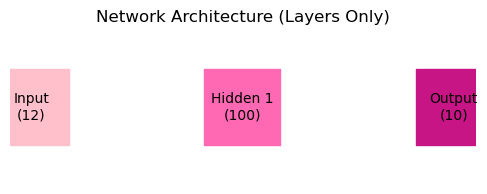

In [28]:
nn_model = best_models["Neural Network"]  # or whatever you called it

n_inputs = nn_model.coefs_[0].shape[0]
hidden_sizes = nn_model.hidden_layer_sizes if isinstance(nn_model.hidden_layer_sizes, tuple) else (nn_model.hidden_layer_sizes,)
n_outputs = nn_model.coefs_[-1].shape[1]

layers = [n_inputs] + list(hidden_sizes) + [n_outputs]
labels = [
    f"Input\n({n_inputs})",
    *[f"Hidden {i+1}\n({h})" for i, h in enumerate(hidden_sizes)],
    f"Output\n({n_outputs})"
]
pink_colors = ["#FFC0CB", "#FF69B4", "#C71585"]

plt.figure(figsize=(6, 2))
for i, (size, lab) in enumerate(zip(layers, labels)):
    plt.scatter(i, 0, s=3000, marker='s', c =pink_colors[min(i, len(pink_colors)-1)])
    plt.text(i, 0, lab, ha='center', va='center')
plt.axis('off')
plt.title("Network Architecture (Layers Only)")
plt.show()


## SVMs

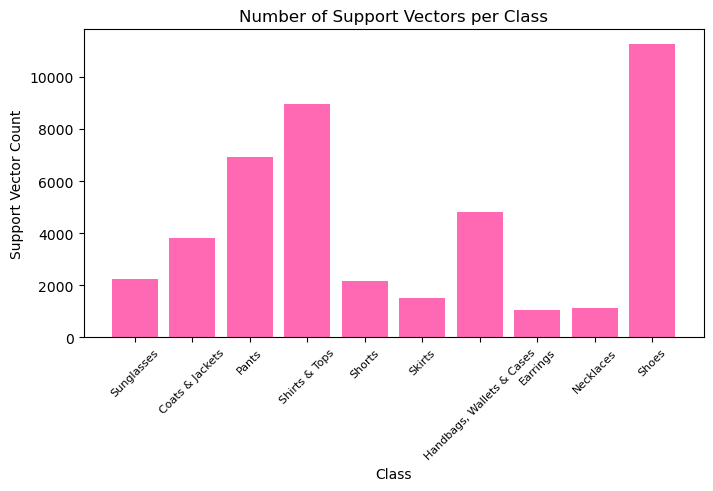

In [29]:

svm_model = best_models["SVM"]  # or whatever you called it
classes = svm_model.classes_
support_counts = svm_model.n_support_
class_labels = ['Sunglasses', 'Coats & Jackets', 'Pants', 'Shirts & Tops', 'Shorts', 'Skirts', 'Handbags, Wallets & Cases', 'Earrings', 'Necklaces', 'Shoes']


plt.figure(figsize=(8,4))
plt.bar(class_labels, support_counts, color="#FF69B4")
plt.xticks(fontsize=8) 
plt.title("Number of Support Vectors per Class")
plt.xlabel("Class")
plt.ylabel("Support Vector Count")
plt.xticks(rotation=45)
plt.show()


## Summary

In [30]:
summary_data = {
    'Model': list(test_results.keys()),
    'CV_accuracy': [best_scores[name] for name in test_results.keys()],
    'Test_accuracy': [test_results[name]['accuracy'] for name in test_results.keys()],
    'Test_MSE': [test_results[name]['mse'] for name in test_results.keys()]
}

summary_df = pd.DataFrame(summary_data)
summary_df = summary_df.sort_values('Test_accuracy', ascending=False)

print(summary_df.to_string(index=False))
print(f"\nbest model: {best_model_name}")
print(f"test accuracy: {test_results[best_model_name]['accuracy']:.4f}")
print(f"test mse: {test_results[best_model_name]['mse']:.4f}")

              Model  CV_accuracy  Test_accuracy  Test_MSE
      random forest     0.639150       0.659972  7.622230
     Neural Network     0.550348       0.554501 10.240789
                SVM     0.539994       0.544529 10.865789
logistic regression     0.496278       0.498407 12.402285

best model: random forest
test accuracy: 0.6600
test mse: 7.6222
